# ACR_4

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

import numpy as np
import scipy
import pandas as pd
import tdt
from pathlib import Path
import matplotlib.pyplot as plt

import hypnogram as hp
import kd_analysis.main.utils as kd
import kd_analysis.main.plots as kp
import kd_analysis.main.hypno as kh
import neurodsp.plts.utils as dspu
import kd_analysis.ACR.acr_utils as acu
bp_def = dict(delta1=(0.75, 1.75), delta2=(2.5, 3.5), delta=(0.75, 4), theta=(4, 8), alpha = (8, 13), sigma = (11, 16), beta = (13, 30), low_gamma = (30, 55), high_gamma = (65, 90), hz40 = [39, 41])

kd_ref = {}
kd_ref['echans'] = [1,2]
kd_ref['fchans']=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
kd_ref['analysis_root'] = Path('/Volumes/opto_loc/Data/ACHR_PROJECT_MATERIALS/ACHR_3/ACHR_3-analysis-data')
kd_ref['tank_root'] = Path('/Volumes/opto_loc/Data/ACHR_3/ACHR_3_TANK')

import plotly.express as px

In [2]:
a4_info = {}
a4_info['subject'] = 'ACR_4'
a4_info['complete_key_list'] = ['control1-bl', 'laser1-bl', 'control1', 'laser1']

In [3]:
chans = [1,2,3,4]
store = 'EEGr'
a4de = acu.load_complete_dataset_from_blocks(a4_info, store, chans, time=4)

read from t=0s to t=51591.2s
Using 610.3516 Hz as SEV sampling rate for EEGr
read from t=0s to t=51591.2s
Using 610.3516 Hz as SEV sampling rate for EEGr
read from t=0s to t=16464.09s
Using 610.3516 Hz as SEV sampling rate for EEGr
read from t=0s to t=19567.58s
Using 610.3516 Hz as SEV sampling rate for EEGr


In [4]:
a4se = kd.get_spg_from_dataset(a4de)

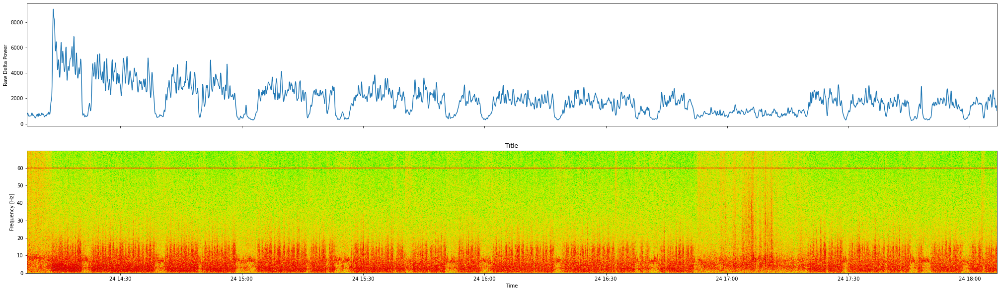

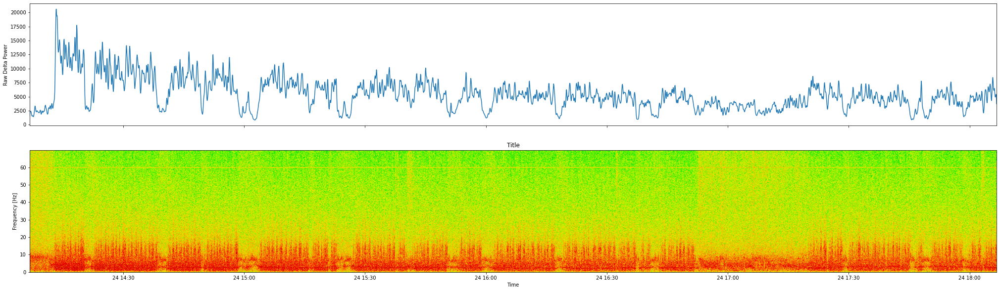

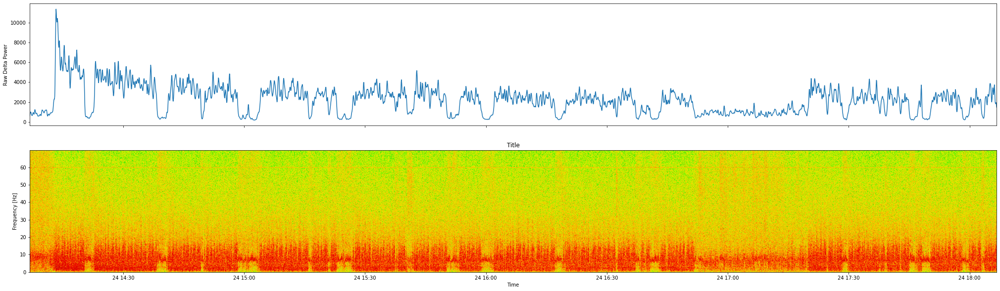

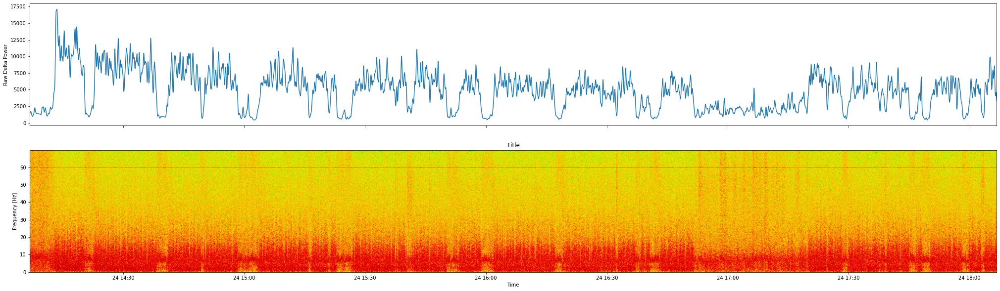

In [6]:
for chan in [1,2,3,4]:
    kp.plot_bp_and_spectro(a4se['control1'], chan, None, bp_def, 'delta')

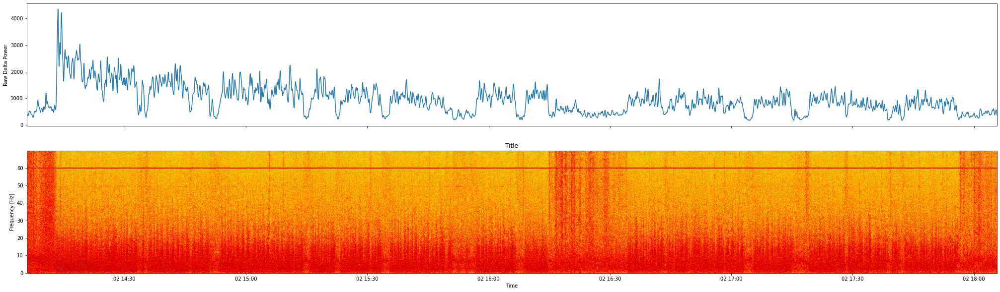

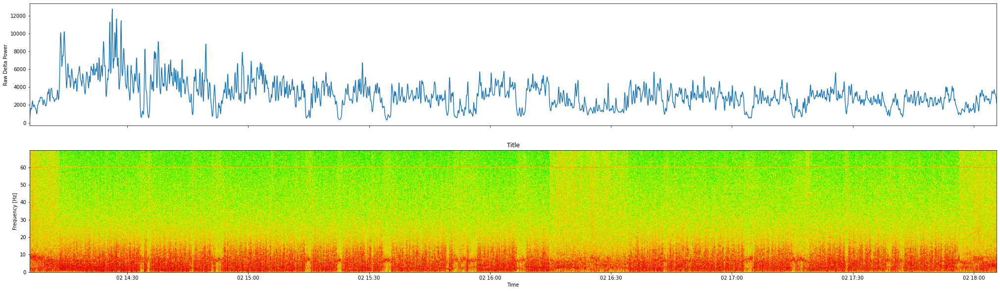

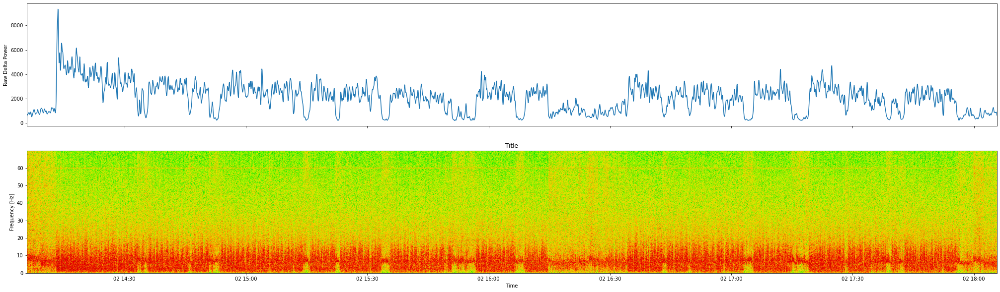

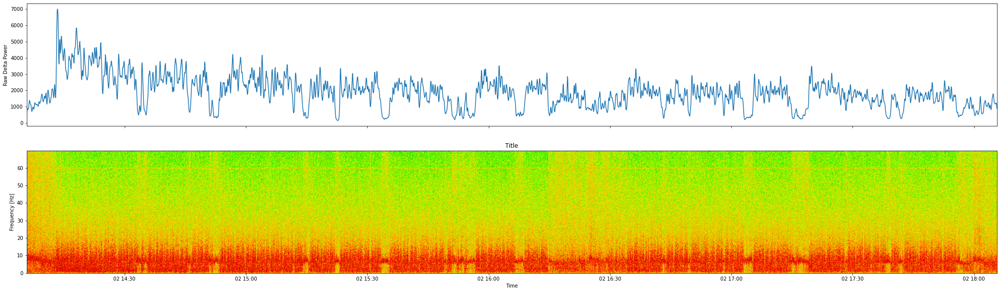

In [5]:
for chan in [1,2,3,4]:
    kp.plot_bp_and_spectro(a4se['laser1'], chan, None, bp_def, 'delta')

In [40]:
def plot_bp_together(s1, s2, chan, bp_def, band):
    bp1 = kd.get_bp_set2(s1, bp_def)
    bp1 = bp1.sel(channel=chan)
    bp2 = kd.get_bp_set2(s2, bp_def)
    bp2 = bp2.sel(channel=chan)
    bpdf = bp1[band].to_dataframe()
    bpdf['cond2'] = bp2[band].values
    bpdf = bpdf.set_index('time')
    bpdf = bpdf.drop(labels=['channel', 'timedelta'], axis=1)
    fig = px.line(bpdf)
    return fig

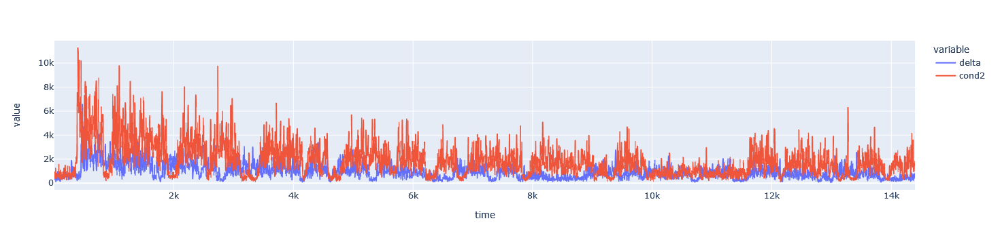

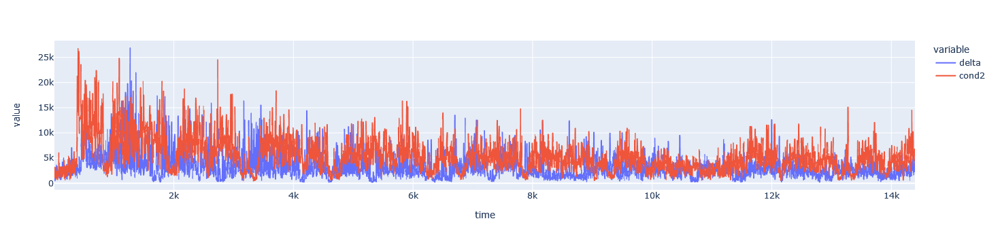

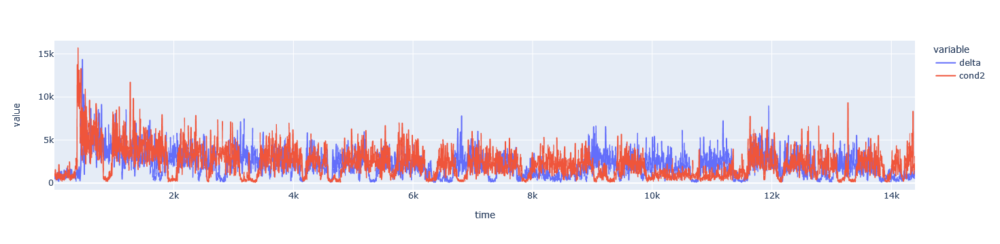

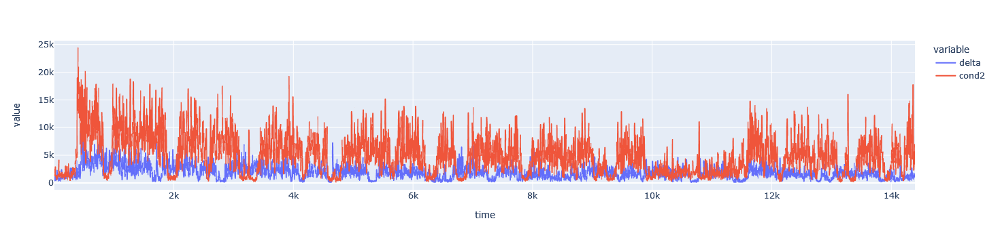

In [43]:
for chan in [1,2,3,4]:
    fig = plot_bp_together(a4se['laser1'], a4se['control1'], chan, bp_def, 'delta')
    fig.show()